<a href="https://colab.research.google.com/github/AdinGarbowit/Prob-and-Stats--AG/blob/main/Hahn_Math_24_Final_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Final Project Notebook - Spring 2024
## Applying the Alexnet Model to Images

In [ ]:
import matplotlib.pyplot as plt #provides plotting and graphing capabilities in the notebook
import imageio #allows for the reading and displaying of images in an output
import torch #imports a package important to converting data into tensors and training/testing neural networks
import torchvision #imports the torchvision package: important for neural network development and visualization
from torchvision import models, transforms #imports pre-trained neural network models and image transformation functions necessary for neural networks
import numpy as np #imports important numerical values and operations into the noteboo
from torchvision.models import * #imports pre-trained neural network models into the code
from PIL import Image #imports image manipulation functions as well as image reading and displaying functions (similar to imageio)
import requests #imports a package that allows code to use urls to grab data/images from the Internet
from torchvision import models #imports pre-trained neural network models
from torchsummary import summary #the summary import is helpful for creating reports on how a neural network is operating
                                 #it will describe the type of layer, shape of output, and number of parameters for a convolutional neural network

In [ ]:
def plot(x): #creating a function that will be able to plot an inputted image x
    fig, ax = plt.subplots() #begins a figure that contains a set of however many necessary subplots
    im = ax.imshow(x,cmap='gray') #plots the image in grayscale
    ax.axis('off') #removes the axis display from the plot
    fig.set_size_inches(20, 20) #sets the dimensions of the plot to five inches by five inches
    plt.show() #shows the generated plot in the output

In [ ]:
im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')
#defines im as using the .imread function from the imageio package to read the png image
#the image will be displayed when the plot function is used on the variable im

<ipython-input-3-756d3b94595f>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')


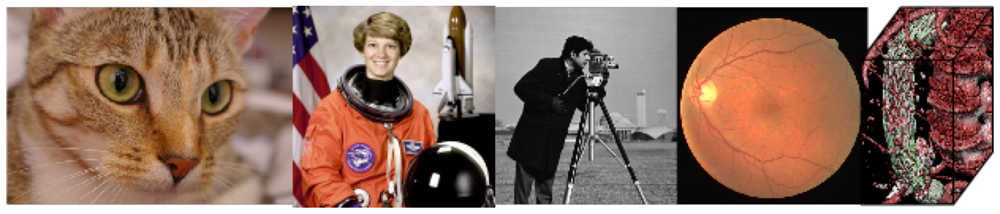

In [ ]:
plot(im) #using the created plot function from above, the variable im is displayed in the output of this line
#the image displays a banner with five images: a cat, astronaut, photographer, cell, and colored rectangular prism

In [ ]:
net = alexnet(pretrained=True).cuda(0) #defines net as an initilized Alexnet model that has been pretrained
                                       #the model is saved to the GPU (.cuda(0))
                                       #this Alexnet neural network model will provide the capability to analyze inputted images and assign labels to those images

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:03<00:00, 66.1MB/s]


In [ ]:
#the variable normalize is being created in order to normalize an image input's color channels to the below parameters
normalize = transforms.Normalize( #normalize is defined as using the .Normalize function from the transforms import
   mean=[0.485, 0.456, 0.406], #the mean for the red color channel is 0.485, green is 0.456, and blue is 0.406
   std=[0.229, 0.224, 0.225] #the standard deviation for the red color channel is 0.229, green is 0.224, and blue is 0.225
) #these specific values of mean and std are important for preparing images for neural network interepretation
  #these values are standard for neural networks
#the variable preprocess is being created in order to manipulate the images into a format where they can be put into the neural network
preprocess = transforms.Compose([ #preprocess is defined as using the .Compose function from the transfoms import (.Compose allows code to create a series of transformations to an image)
   transforms.Resize(256),#using .Resize, the image is resized to a size of 256 pixels by 256 pixels
   transforms.CenterCrop(224), #using .Centercrop, the image is cropped to a size of 224 pixels by 224 pixels (starting from the center of the image)
   transforms.ToTensor(), #using .ToTensor, the image is converted from its initial format to a tensor format
   normalize #the normalize function defined above is then applied to the the image
]) #the output of this function is an image that has been processed in such a way that it can be used in the neural network
   #the transformation functions being applied to the images are important for creating consistency between all of the images

In [ ]:
im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg') #the im variable is defined as a jpg of a golden retriever
#defines im as using the .imread function from the imageio package to read the jpg image
#the image will be displayed when the plot function is used on the variable im

<ipython-input-7-6ef0d63cbdf7>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg') #the im variable is defined as a jpg of a golden retriever


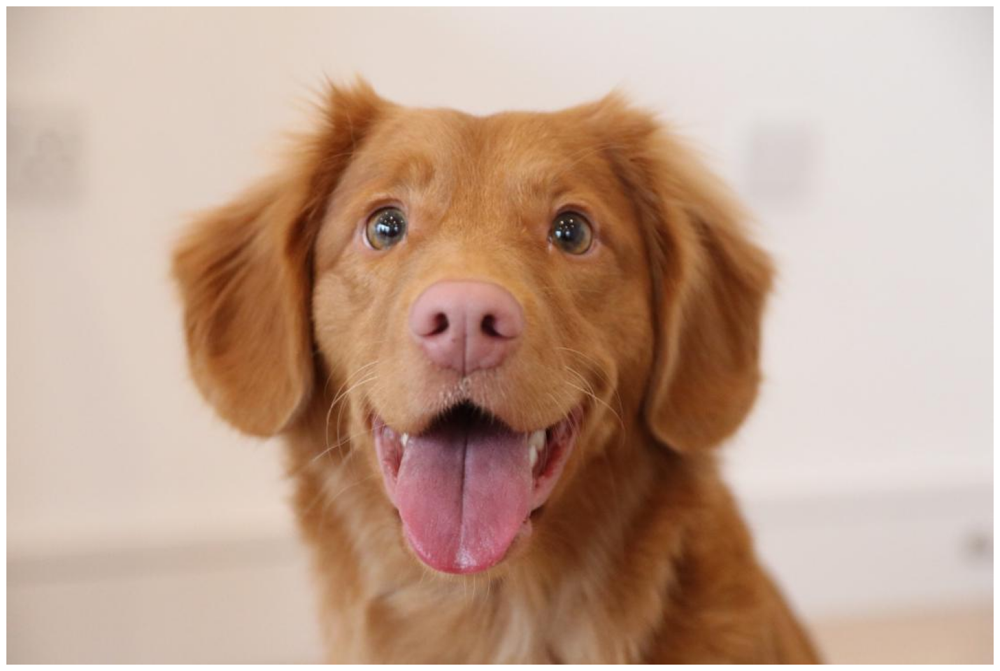

In [ ]:
plot(im) #using the plot function, the im variable is plotted and displayed in the output below
#the output is a jpg photo of a golden retriever

In [ ]:
image = Image.fromarray(im) #convert to pil
#this line of code defines image as taking a numpy array and converting it to a pil (Python Imaging Library)

In [ ]:
img_tensor = preprocess(image) #img_tensor is defined as taking the pil image and applying the preprocess function to it
                               #the pil image is now in a tensor format and has been manipulated into a format ready for neural network processessing

In [ ]:
img_tensor = img_tensor.unsqueeze_(0) #the .unsqueeze function adds a new dimension to the beginning (indicated by 0) of the tensor
                                      #this process converts the img_tensor variable from a three dimensional tensor to a four dimensional tensor
                                      #the new dimension at the beginning of the tensor will indicate what batch the image is a part of

In [ ]:
img_tensor.shape #.shape prints the dimensions of the created img_tensor variable
                 #the first dimension is 1, representing the first batch
                 #the second dimension is 3, representing the three color channels of the tensor
                 #the third dimension is 224, representing the 224 pixel height of the tensor
                 #the fourth dimension is 224, representing the 224 pixel width of the tensor

torch.Size([1, 3, 224, 224])

In [ ]:
img_variable = torch.tensor(img_tensor).cuda(0) #img_variable is defined as taking the img_tensor variable and saving it to the GPU

<ipython-input-13-b03eb37e07cf>:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0) #img_variable is defined as taking the img_tensor variable and saving it to the GPU


In [ ]:
out = net(img_variable) #the out variable is defined as applying net (the Alexnet model) to the img_variable

##Argmax Function
The argmax function plays a critical role in Convolutional Neural Networks. In this case, the Alexnet model is using the softmax function to identify what the probabilities of each label being correct is for each image. The argmax in the proceeding block of code will identify what the highest probability label is for each image

In [ ]:
#this line of code is used to generate the position of the predicted label found by the Alexnet model
label_index = out.cpu().data.numpy().argmax() #label_index is defined as saving out (the application of Alexnet to the image) to the CPU
                                              #the image's data is then taken and converted into a numpy array
                                              #the .argmax function is then used to to find the position of the highest value in the array
                                              #the highest value is important as it is indicative of which label Alexnet assigned the highest level of confidence to

In [ ]:
label_index #the label_index is called and the position of the highest level confidence label is displayed in the output

215

In [ ]:
#this line of code is being used to generate a list of the top 10 best predicted guesses generated by Alexnet for the golden retriever
top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:]) #top_list is defined as sorting the numpy array of values from lowest to highest
                                                                #the last 10 values of the sorted array are then taken
                                                                #using np.flip, the order of those values are swapped and the top 10 values are sorted highest to lowest

In [ ]:
LABELS_URL = 'https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json' #LABELS_URL is being defined as a .json file containing a list of neural network labels
                                                                                #the file contains 1000 labels which the neural network can use to assign to inputted images
                                                                                #these are the labels that Alexnet will use to try and assign to the golden retriever image

In [ ]:
labels = {int(key):value for (key, value) in requests.get(LABELS_URL).json().items()}
#labels is defined as creating a dictionary of strings from a .json file that will be converted to integers
#This file contains 1000 different labels for the neural network to use

In [ ]:
print(labels[label_index]) #with the labels now loaded as a dictionary, by inputting the label index into labels, Alexnet's best prediction can be found
                           #the output of this is "Brittany spaniel," which is what Alexnet generated as having the highest level of confidence for a label for the golden retriever

Brittany spaniel


In [ ]:
for i in range(10): #this repreats the process below ten times
    print(labels[top_list[i]]) #this line prints the top ten best predictions using the top_list function created above and finding what the index position represents in labels

Brittany spaniel
Sussex spaniel
golden retriever
Irish setter, red setter
tennis ball
vizsla, Hungarian pointer
clumber, clumber spaniel
kelpie
Border collie
cocker spaniel, English cocker spaniel, cocker


In [ ]:
net #calling the net variable shows the process of how Alexnet functions
    #the output of this block shows the layers and image manipulations that Alexnet is performing to the images inputted into it
    #information such as the kernel size, number of input features, and number of output features can be seen in the output of this code

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [ ]:
summary(net, (3, 224, 224)) #using the summary function from torch summary, the breakdown of Alexnet can be seen in a better format
                            #the first column of the summary shows the layer of Alexnet
                            #the second column of the summary shows what output shape of the layer is
                            #the third column of the summary shows the number of paramters associated with that layer
                            #at the bottom of the chart is a summary of paramaters, their trainability, and the size of output

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-14            [-1, 25

In [ ]:
out = net.features[0](img_variable).cpu().detach().numpy() #out is being redefined as applying the first layer of features to the img_variable
                                                           #the manipulated image is saved to the cpu
                                                           #.detach will prevent gradient calculations from being performed on the image
                                                           #.numpy manipulates the image into a numpy array format

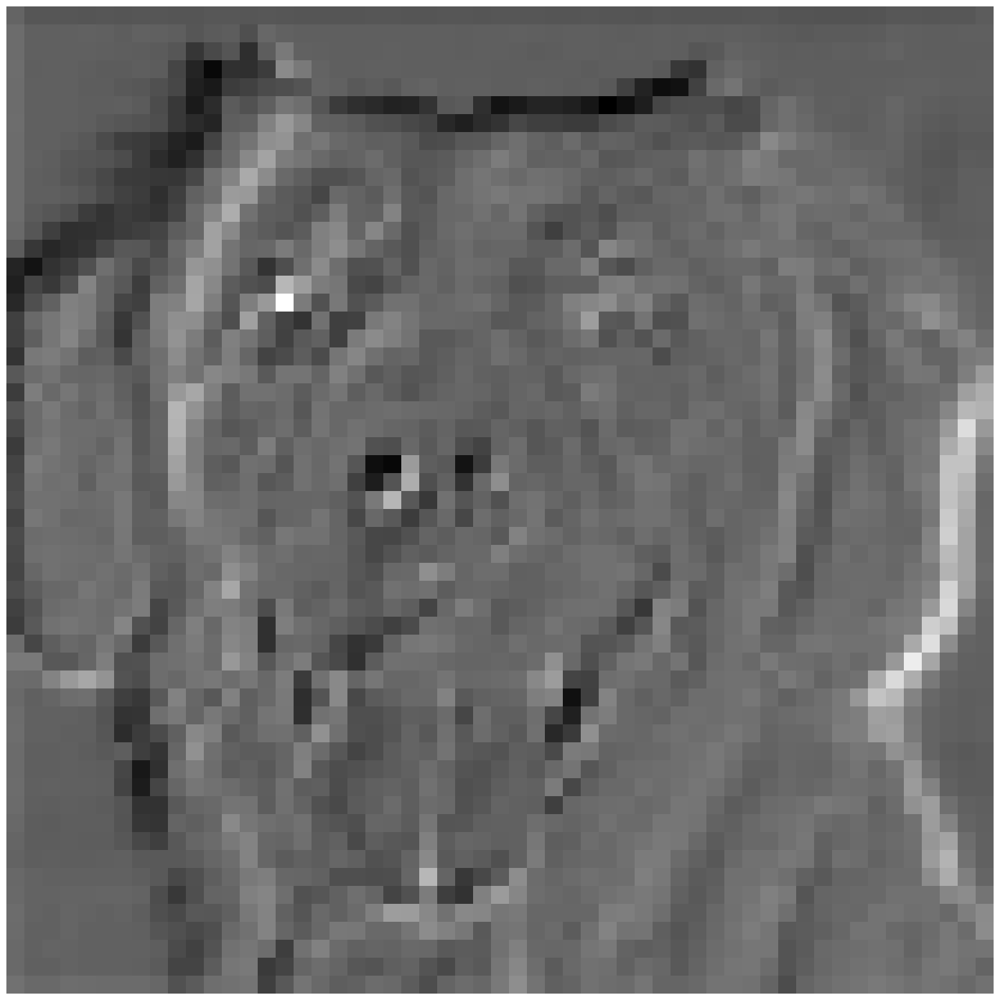

In [ ]:
plot(out[0,0,:,:]) #using the plot function, the out variable (which has been through the first feature layer) is plotted in the output of this code
                   #the image displayed in the output is of the golden retriever in grayscale. It has been put through the first feature layer so the image is heavily pixelated

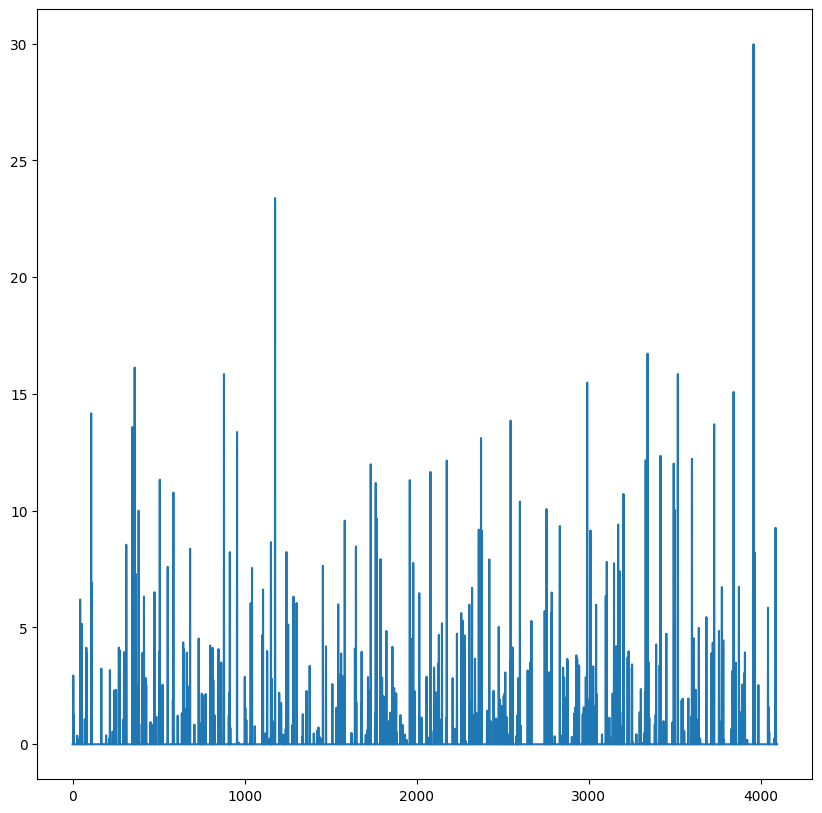

In [ ]:
#this plot will be used to display a visualization of the first six classifcation layers of the Alexnet model on the image of the golden retriever
#the x axis represents the array of indices
#the y axis represents the corresponding output value for the indices as a result of Alexnet's manipulations
plt.plot(np.arange(4096),net.classifier[0:6](net.avgpool(net.features[0:13](img_variable)).flatten()).cpu().detach().numpy()) #the image is put through the first 13 feature layers of Alexnet
                                                                                                                              #the image is then put through the first 6 classifcation layers of Alexnet
                                                                                                                              #the image is flattened to one dimension
                                                                                                                              #it is then saved to the CPU
                                                                                                                              #.detach is applied to it to prevent gradient calculations
                                                                                                                              #.numpy converts it to a numpy array
fig = plt.gcf() #sets the fig variable equal to the current figure (.gcf means get current figure)
fig.set_size_inches(10, 10) #sets the size of the plot to 10 inches by 10 inches

In [ ]:
im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')
#defines im as using the .imread function from the imageio package to read the php image
#the image will be displayed when the plot function is used on the variable im

<ipython-input-27-dc28ff887633>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')


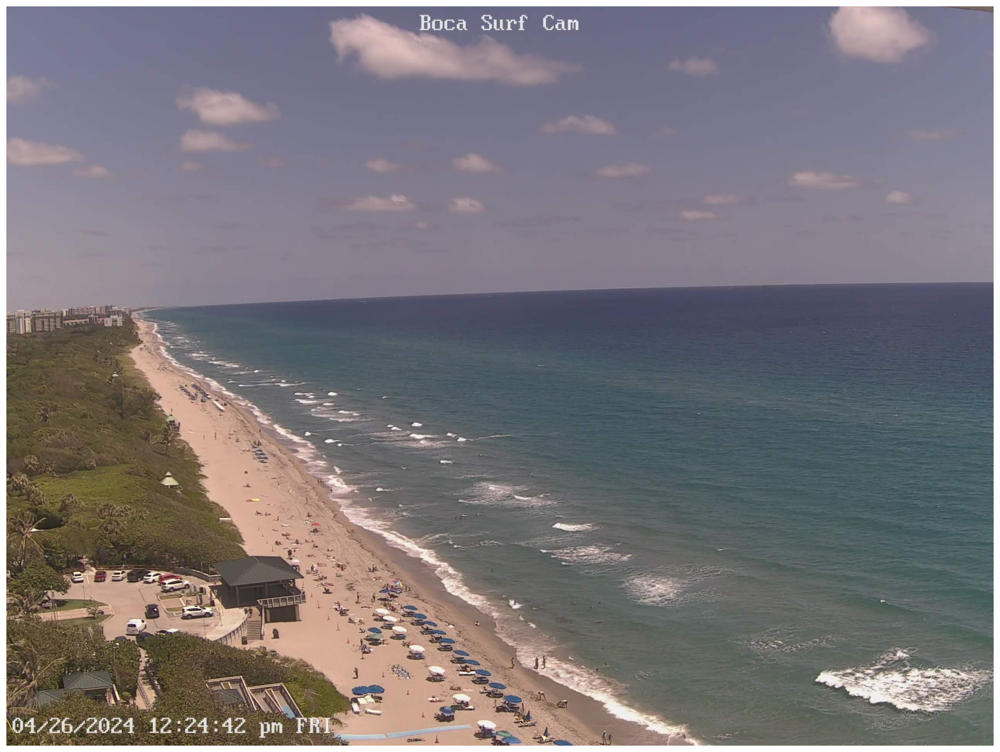

In [ ]:
plot(im) #using the created plot function from above, the variable im is displayed in the output of this line
#the image displays an image from the Boca Surf Cam; a beach with people walking around can be seen in the output

In [ ]:
def load_im(im): #the load_im function is being used to combine all the necessary image manipulation processes into one function
    image = Image.fromarray(im) #this line of code defines image as taking a numpy array and converting it to a pil (Python Imaging Library)
    img_tensor = preprocess(image)#img_tensor is defined as taking the pil image and applying the preprocess function to it
                                  #the pil image is now in a tensor format and has been manipulated into a format ready for neural network processessing
    img_tensor = img_tensor.unsqueeze_(0) #the .unsqueeze function adds a new dimension to the beginning (indicated by 0) of the tensor
                                          #this process converts the img_tensor variable from a three dimensional tensor to a four dimensional tensor
                                          #the new dimension at the beginning of the tensor will indicate what batch the image is a part of
    img_variable = torch.tensor(img_tensor).cuda(0) #img_variable is defined as taking the img_tensor variable and saving it to the GPU
    return img_variable #returns the processed image

In [ ]:
out = net(load_im(im)) #the out variable is defined as applying the net variable (Alexnet) to a processed image (load_im(im))

<ipython-input-29-759fc1a09b23>:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0) #img_variable is defined as taking the img_tensor variable and saving it to the GPU


In [ ]:
def inference(im): #the inference function will be used to print the 10 best predictions that Alexnet generated for the inputted image
                   #At the top of the output, the best prediction will be printed
    out = net(load_im(im)) #the out variable is defined as applying the net variable (Alexnet) to a processed image (load_im(im))
    label_index = out.cpu().data.numpy().argmax() #label_index is defined as saving out (the application of Alexnet to the image) to the CPU
                                                  #the image's data is then taken and converted into a numpy array
                                                  #the .argmax function is then used to to find the position of the highest value in the array
    top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:]) #top_list is defined as sorting the numpy array of values from lowest to highest
                                                                    #the last 10 values of the sorted array are then taken
                                                                    #using np.flip, the order of those values are swapped and the top 10 values are sorted highest to lowest
    print(labels[label_index]) #with the labels now loaded as a dictionary, by inputting the label index into labels, Alexnet's best prediction can be found
                               #the best prediction from Alexnet will be printed at the top of the output
    for i in range(10): #this repreats the process below ten times
        print(labels[top_list[i]]) #this line prints the top ten best predictions using the top_list function created above and finding what the index position represents in labels

In [ ]:
inference(im) #applies the inference function to the image of the Boca Beach Cam

seashore, coast, seacoast, sea-coast
seashore, coast, seacoast, sea-coast
promontory, headland, head, foreland
valley, vale
lakeside, lakeshore
sandbar, sand bar
cliff, drop, drop-off
breakwater, groin, groyne, mole, bulwark, seawall, jetty
dam, dike, dyke
wing
volcano


<ipython-input-29-759fc1a09b23>:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0) #img_variable is defined as taking the img_tensor variable and saving it to the GPU


# Custom Data Deck
## Applying the Alexnet Model and a Created Model to a Custom Dataset

In [ ]:
%%capture
#%%capture will prevent the output of this cell from being display while still runing the code
!pip install wandb #installs the weights and biases package so it can later be imported
!apt-get install poppler-utils #installs a package that helps with pdf manipulations
!pip install pdf2image #installs a package that can take pdfs and reinterpret that them as images within the notebook
!pip install flashtorch #installs a package that allows for the visualization of neural networks
import requests #imports a package that allows code to use urls to grab data/images from the Internet
from pdf2image import convert_from_path #imports convert_from_path from the installed pdf2image package to allow pdfs to become lists of images
import matplotlib.pyplot as plt #provides plotting and graphing capabilities in the notebook
import numpy as np #imports important numerical values and operations into the notebook
import torch #imports a package important to converting data into tensors and training/testing neural networks
import requests  #imports a package that allows code to use urls to grab data/images from the Internet
from torchvision import * #includes neural network image transformations and models
from torchvision.models import * #imports pre-trained neural network models into the code
from flashtorch.utils import apply_transforms #apply_transforms is important for manipulations to images before they are put into a neural network
import wandb as wb #imports the weights and biases package. This is important for neural networks as it will provide live plots to show the accuracy and loss of a network

##CPU Vs. GPU for Project
GPU is generally used for convolutional networks because they outperform CPU for this particular kind of neural network (GPU is better equipped to handle large amounts of vectors and matrices which is important in convolution). I utilized CPU in this project because of Google Colab's Timeout rule for overusing GPU. The CPU can easily be swapped out for GPU by referencing .device('cuda') in the below code.

In [ ]:
def CPU(data): #creating a function that takes a dataset and interprets it as a tensor stored in the CPU
    return torch.tensor(data, requires_grad=True, dtype=torch.float) #Gradients of the data will be tracked and stored as floating data points

def CPU_data(data): #creating a function that takes a dataset and interprets it as a tensor stored in the CPU (Does not track gradients)
    return torch.tensor(data, requires_grad=False, dtype=torch.float) #Gradients of the data will not be tracked, data is stored as floating data points

In [ ]:
def plot(x): #creating a function that will be able to plot an inputted image x
    fig, ax = plt.subplots() #begins a figure that contains a set of however many necessary subplots
    im = ax.imshow(x, cmap = 'gray') #plots the image in grayscale
    ax.axis('off') #removes the axis display from the plot
    fig.set_size_inches(5, 5) #sets the dimensions of the plot to five inches by five inches
    plt.show() #shows the generated plot in the output

In [ ]:
def get_google_slide(url): #creating a function to retrieve a google slide from the Internet using an inputted URL
    url_head = "https://docs.google.com/presentation/d/" #defines the head of the url as the generic link that preceeds the identifying slide ID
    url_body = url.split('/')[5] #defines the body of the url as the identifying slide ID by going to fifth slash and extracting what preceeds it
    page_id = url.split('.')[-1] #defines the page ID as the letters and numbers that come after the last . of the url
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id #using export and pageid=, the url will be used to
                                                                                     #extract the presentation and each individual slide
def get_slides(url): #creating a function to generate an image for each slide from a Google slide
    url = get_google_slide(url) #defines url as the url created by the get_google_slides function (url ready to be exported)
    r = requests.get(url, allow_redirects=True) #defines r as using a get request to go to the google slide and download it as a pdf (allow_redirects allows for the code to continue if a redirect is necessary on the page)
    open('file.pdf', 'wb').write(r.content) #This line will download the google slide as "file.pdf" (interpretted in binary)
    images = convert_from_path('file.pdf', 500) #images is defined as taking the downloaded pdf and interpretting it as a list of images (resolution of 500 for each image)
    return images #returns the generated images

def load(image): #creating a function that will load the images from the Google slide in a form appropriate for neural network processing

    return apply_transforms(image).clone().detach().requires_grad_(True).to(device) #uses the apply_transforms utility to the image to ready it for a neural network
                                                                                    #creates a clone of the image which will not need gradient tracking
                                                                                    #applies gradient tracking to the orignal image and saves to the available device

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") #device is defined as the GPU if it is avaiable. If not, device is defined as the CPU

In [ ]:
#this line of code is taking from the Internet a pre-created list of neural network labels to apply for this neural network
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()}
#labels is defined as creating a dictionary of strings from a .json file that will be converted to integers
#This file contains 1000 different labels for the neural network to use

In [ ]:
model = alexnet(weights='DEFAULT').to(device) #defines model as the Alexnet neural network model imported from torchvision.models
                                              #the weights for the model (connections between neural networks designed to minimize loss) are set to default (pre-created)
model.eval(); #model is put into evaluation mode where it will be evaluate images rather than be trained on them. The semi-colon prevents this block of code from creating a visible outpit

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:03<00:00, 68.0MB/s]


In [ ]:
url = "https://docs.google.com/presentation/d/1jddkQftuPYNsXPTefSk7skjkY_mNMrwJBkGRW8hEoPg/edit#slide=id.p" #defines url as the custom Google slide dataset for the project

## Custom Data Set for this Project
For this project, I decided to create a data set that consisted half of alive trees and half of dead trees. I chose tree images that had minimal objects or colors in the background.

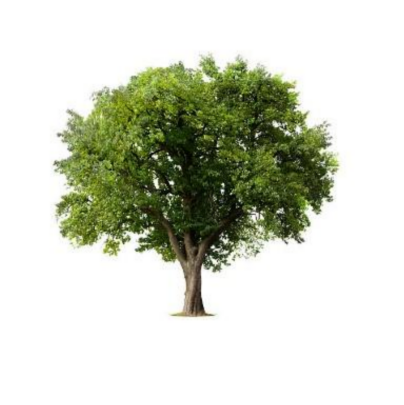

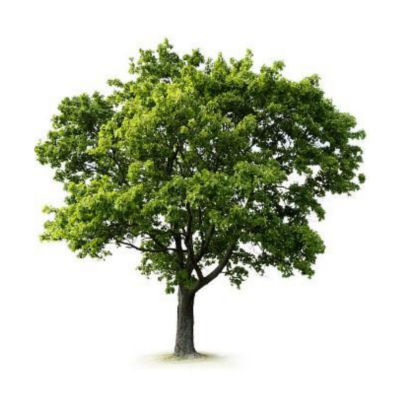

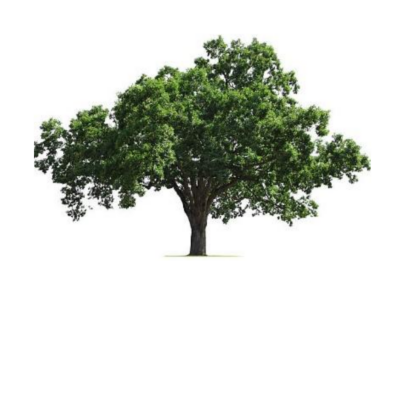

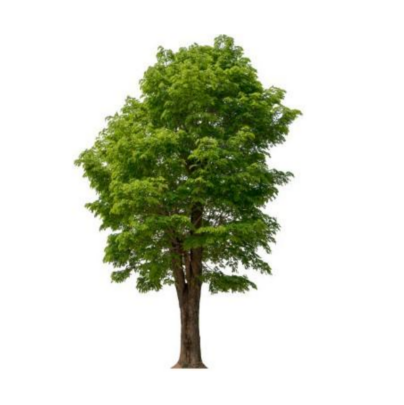

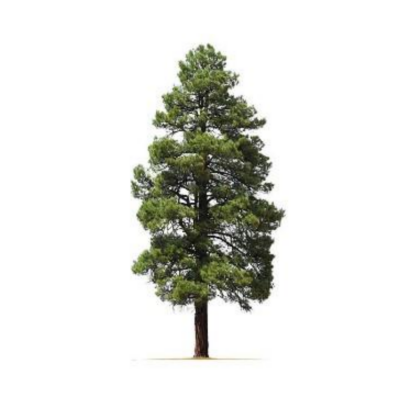

...

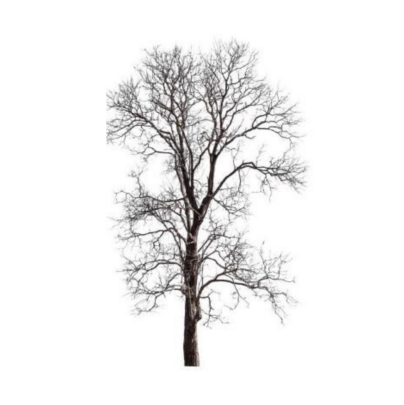

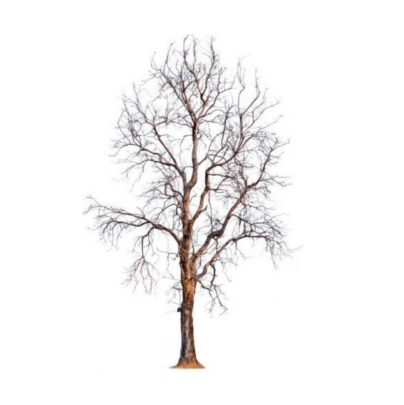

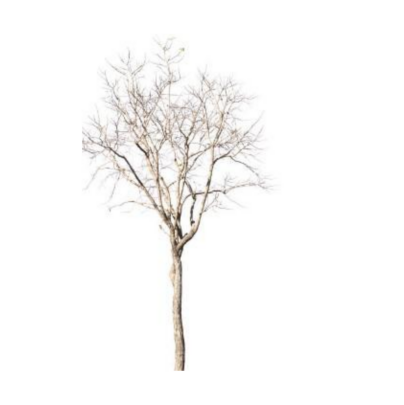

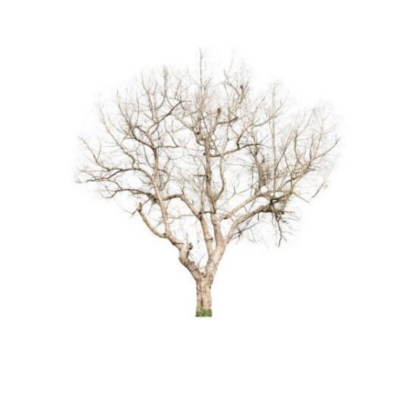

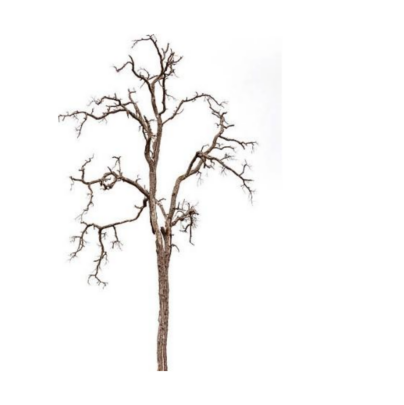

In [ ]:
images = [] #images is inititated as an empty list of items

for image in get_slides(url): #for each image (or slide) that is taken using the get_slides function, the process below repeats

    plot(image) #the retrieved image is plotted in the output

    images.append(load(image)) #adds the image that has been manipulated for neural networks to the image list

images = torch.vstack(images) #stacks the newly created processed list of images as a vertical list of tensors

In [ ]:
images.shape #prints the four dimensional shape of the list of images
#The first dimension is 50, which represents the 50 images included in the list
#The second dimension is 3, which represents the 3 color channels of the images (Red, Green, Blue)
#The third dimension is 224, which represents the images' height of 224 pixels
#The fourth dimension is 224, which represents the images' width of 224 pixels

torch.Size([50, 3, 224, 224])

In [ ]:
model(images) #applies the Alexnet model to the images
#This generates a tensor with the size 50x1000 (50 images and 1000 labels)
#Each value in the tensor indicates the confidence (or probability) that the assigned label is correctly attributed to a given image
#The higher the value, the higher the degree of confidence is (3.8654 indicates higher confidence than -6.0645)

tensor([[ 2.8726, -0.1816, -5.0721,  ..., -2.7182,  0.9112, -1.0481],
        [ 3.0481, -0.4995, -4.5806,  ..., -2.7447,  2.0783, -1.0639],
        [ 2.6469, -0.8556, -5.2379,  ..., -2.3473,  1.1596, -0.1663],
        ...,
        [-2.2557, -0.3166, -3.1034,  ..., -2.2794,  0.2079,  2.0602],
        [-0.6657,  0.1777, -3.2609,  ..., -1.9016,  0.9202,  0.7657],
        [-4.0215, -1.0055, -2.8620,  ..., -3.3242, -0.3647,  1.1492]],
       grad_fn=<AddmmBackward0>)

In [ ]:
y = model(images) #now, y is defined as the Alexnet model being applied to the images

In [ ]:
y.shape #prints the shape of y
#The first dimension is 50, which is the number of images in the dataset
#The second dimension is 1000, which is the the number of labels taken from the .Json file in previous code

torch.Size([50, 1000])

##Argmax Function
The argmax function plays a critical role in Convolutional Neural Networks. In this case, the Alexnet model is using the softmax function to identify what the probabilities of each label being correct is for each image. The argmax in the proceeding block of code will identify what the highest probability label is for each image

In [ ]:
guesses = torch.argmax(y, 1).cpu().numpy() #guesses is defined as taking the highest assigned confidence for each image's corresponding label
                                           #the guesses are stored in the CPU and interpreted as an array rather than a tensor

In [ ]:
#This block of code will print the best prediction that Alexnet generated for each image
for i in list(guesses): #This process below will repeat for as many guesses are contained in the guesses variable (defined above)
    print(labels[i]) #prints each best guess label in the output below

buckeye, horse chestnut, conker
buckeye, horse chestnut, conker
broccoli
broccoli
triumphal arch
broccoli
broccoli
buckeye, horse chestnut, conker
broccoli
buckeye, horse chestnut, conker
broccoli
broccoli
buckeye, horse chestnut, conker
broccoli
broccoli
buckeye, horse chestnut, conker
broccoli
buckeye, horse chestnut, conker
buckeye, horse chestnut, conker
buckeye, horse chestnut, conker
buckeye, horse chestnut, conker
buckeye, horse chestnut, conker
broccoli
broccoli
broccoli
park bench
kite
kite
white stork, Ciconia ciconia
bee eater
bald eagle, American eagle, Haliaeetus leucocephalus
white stork, Ciconia ciconia
swing
sulphur-crested cockatoo, Kakatoe galerita, Cacatua galerita
bald eagle, American eagle, Haliaeetus leucocephalus
swing
bee eater
bald eagle, American eagle, Haliaeetus leucocephalus
corkscrew, bottle screw
bald eagle, American eagle, Haliaeetus leucocephalus
kite
pole
bald eagle, American eagle, Haliaeetus leucocephalus
kite
sulphur-crested cockatoo, Kakatoe galeri

In [ ]:
Y = np.zeros(50,) #defines Y as an array of 50 zeros
Y[25:] = 1 #Replaces the latter half of the array (position 25 onward) with 1s

In [ ]:
Y #prints the created array (First half is 1s and the second half is 0s)

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [ ]:
X = y.detach().cpu().numpy() #defines X as y (the model output for the images) without gradient tracking, stored to the CPU, and interpretted as an array

In [ ]:
X.shape #prints the shape of X, which is the same as the shape of y (no longer a tensor, though)
#the first dimension is 50, the number of images
#the second dimension is 1000, the number of labels

(50, 1000)

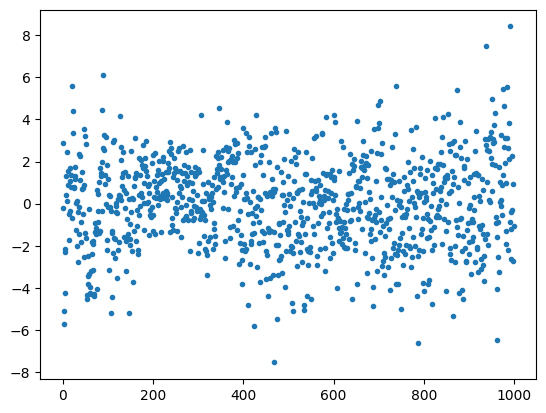

In [ ]:
#This line of code creates a plot that displays each label with its corresponding confidence level as developed from the Alexnet model
plt.plot(X[0],'.') #Using the first element of the X array, a plot (with dots) is generated

In [ ]:
X[0] #prints the first element of the X array, which is the confidence level for each of the labels and the corresponding image

array([ 2.87263417e+00, -1.81568444e-01, -5.07210064e+00, -5.71988297e+00,
       -2.13066483e+00, -2.29261184e+00, -4.25497818e+00,  4.06780213e-01,
        1.31054771e+00,  2.44039488e+00,  1.16898432e-01,  8.84974539e-01,
        1.56447172e+00, -4.73739713e-01, -1.72674298e+00,  1.08766532e+00,
        1.70670271e+00, -3.58923882e-01,  1.37424242e+00,  8.12125981e-01,
       -6.63306594e-01,  5.59462976e+00,  3.33230400e+00,  4.37844658e+00,
        7.38929510e-01,  8.00467849e-01,  1.18534112e+00,  1.74022913e+00,
        1.31954157e+00,  3.31653953e-02, -1.22913754e+00, -1.99979329e+00,
        1.49367794e-01, -2.76794910e+00, -3.79596233e-01, -1.59987688e-01,
        2.34161496e+00, -1.43389440e+00,  2.23816919e+00,  1.13745928e+00,
       -1.80738842e+00, -8.63071144e-01,  7.07603931e-01,  1.50276160e+00,
        7.43998885e-01, -4.69521284e-01,  8.69468629e-01,  3.55240393e+00,
       -2.54943657e+00, -1.39616823e+00,  3.19655180e+00,  2.80820417e+00,
       -1.65122449e+00, -

In [ ]:
np.argmax(X[0]) #using the argmax function from the numpy package, the position of the highest confidence value is found (958)

990

In [ ]:
labels[958] #With the value of 958 generated from the previous line of code, the predicted label can be found by inputting position 958 into the labels list
#The output of position 958 is "Granny Smith," which is what the Alexnet model deemed to be the strongest prediction from its softmax calculation

'hay'

In [ ]:
top_ten = np.argsort(X[0])[::-1][0:10] #top_ten is defined as sorting the top 10 best guesses from the model from highest to lowest

In [ ]:
for i in top_ten: #repeats the process for each label contained in the top_ten variable (ten)
    print(labels[i]) #prints each guess from top_ten

buckeye, horse chestnut, conker
broccoli
sulphur-crested cockatoo, Kakatoe galerita, Cacatua galerita
kite
pot, flowerpot
rapeseed
lakeside, lakeshore
triumphal arch
orange
park bench


In [ ]:
labels #prints the entire list of labels (1000)

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

(array([  3.,  24.,  64., 208., 270., 266., 134.,  23.,   6.,   2.]),
 array([-7.53283501, -5.93901443, -4.34519386, -2.75137353, -1.15755308,
         0.43626738,  2.03008795,  3.62390828,  5.21772861,  6.81154919,
         8.40536976]),
 <BarContainer object of 10 artists>)

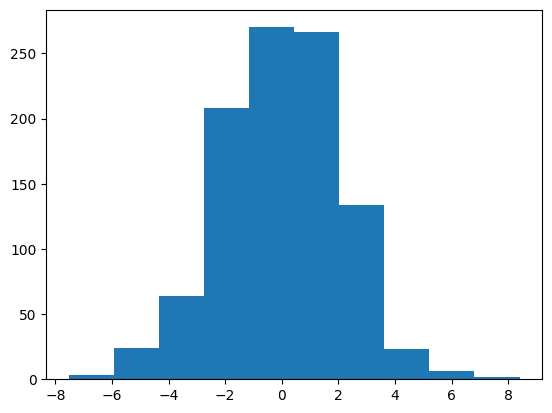

In [ ]:
plt.hist(X[0]) #plots a histogram interpretation of the confidence values for each label (y is the labels and x is the confidence)
#The histogram resembles a normal distribution (Most of the confidence levels have a value of 0, and the farther branched out the plot becomes from 0, the less labels there are)

In [ ]:
X = CPU_data(X) #X is redefined as being stored in the CPU
Y = CPU_data(Y) #Y is redefined as being stored in the CPU

##Creating the Softmax Function

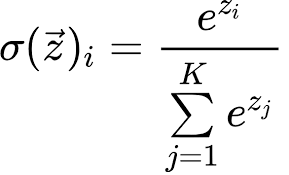

The softmax function is critical to creating a neural network as it represents how confident an assigned label is to an image. This function takes the output of a model (which will be defined below) as its input. In the numerator, e^zi removes all negative values. The denominator then takes the summation of e^zj which will then normalize all of the values. The output of this process will be a list of confidence levels for the assigned labels.

In [ ]:
def softmax(x): #creating a softmax function (with the output of the model as the input)
    s1 = torch.exp(x - torch.max(x,1)[0][:,None]) #s1 is defined as the numerator of the function. There is a slight difference bewteen this numerator and the numerator in the above formula
                                                  #this numerator subtracts the maximum value of x from each x value. This is done in order to avoid computations that are too large
    s = s1 / s1.sum(1)[:,None] #s is defined as the entire function including the denominator (which sums the value of the s1 tensors tarting from position 1)
    return s #returns the value of s from the function (the confidence value)

##Creating the Cross Entropy Function

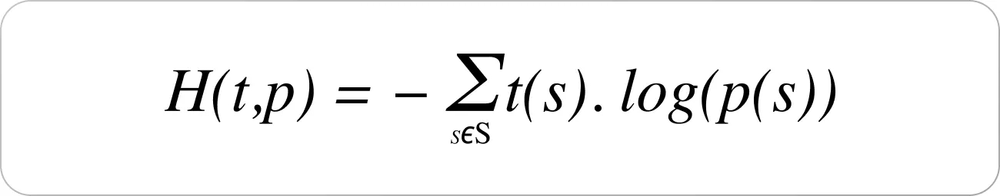

The cross entropy function is used to represent the loss of a neural network. In the formula, t(s) represents the real labels and p(s) represents the predicted labels. The cross entropy function takes summation of the log of the predicted labels multiplied by the real labels; the summation is then multiplied by -1. This function helps display how well the model is performing. If the value of the cross entropy function is low, then the model is performing well and returning accurate results. If the value of the cross entropy function is high, then the model is not performing well as it is return unaccurate results

In [ ]:
def cross_entropy(outputs, labels): #creating a cross entropy function (with outputs and labels as the input)
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0] #the function returns the value of the formula above saved as a tensor

## Variation of the Box-Muller Function (Creating a Truncated Normal Distribution)

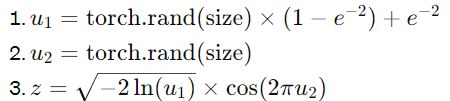

The purpose of this variation of the Box-Muller function is to generate a truncated normal distribution of random numbers. These numbers will be used to generate the weights for the neural network. The weights will be optimized as the neural network cycles through its epochs. u1 is defined as a random number between e^-2 and 1. u2 is defined as a normally distributed random number (between 0 and 1). z integrates u1 and u2 together into one equation that allows a random number to be generated based on an inputted size. Random numbers from truncated normal distribution make it such that the random numbers are maintained between a certain range and cannot become too large or too small. This is very helpful for developing weights for neural network algorthims

In [ ]:
def Truncated_Normal(size): #creating a function to create a truncated normal distribution to use for the neural network weighting

    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2) #the calculation for u1, creating a random number between e^-2 and 1
    u2 = torch.rand(size) #the calculation for u2, creating a random number between 0 and 1
    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2) #the calculation for z, creating a random number from truncated normal distribution

    return z #returns the value of z

## The Accuracy Function
The function below is designed to determine the accuracy of the model. The function takes the sum of all the correct predictions and divides that number by the total number of predictions. This creates a ratio to represent the accuracy of the neural network

In [ ]:
def acc(out,y): #creating an accuracy function
    with torch.no_grad(): #disables the gradient calculations for the purposes of this function
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0] #returns the value of the sum of all corrected predictions divided by the shape of y
                                                                       #torch.max(out,1)[1] == y checks if the prediction is correct and assigns the value 1 to it if it is
                                                                       #y.shape[0] divides the summation of the correct predictions by the total number of predictions

In [ ]:
X.shape #prints the shape of X
#the first dimension is 50 for the number of images in the tensor
#the second dimension is 1000 for the number of labels in the tensor

torch.Size([50, 1000])

In [ ]:
def get_batch(mode): #this function will be used to take data and delegate it to either be used as training data or testing data
    b = c.b #b (the batch size) is defined as equal to the configuration setting for the batch size (defined when configuring weights and biases)
    if mode == "train": #if the mode for the data is set to "train," then the code continues here
        r = np.random.randint(X.shape[0]-b) #r is defined as a random integer in the range of the items in X subtracted by the batch size
        x = X[r:r+b,:] #x is defined as random input features from X
        y = Y[r:r+b] #y is defined as as random input features from Y
    elif mode == "test": #if the mode for the data is not set to "train," it is assumed to be in "test" and the code continues here
        r = np.random.randint(X_test.shape[0]-b)
        x = X_test[r:r+b,:] #x is defined as random input features from X_test
        y = Y_test[r:r+b] #y is defined as random input features from Y_test
    return x,y #returns the value of x,y

In [ ]:
def model(x,w): #creating the neural network model

    return x@w[0] #the model for the neural network is the product of the matrix multiplicated between the input x and the weights w (to be defined below)
                  #the model works by taking the transformed data derviced from the Google slides images and cross multiplying them with weighted values
                  #the data in x contains features which are instrumental to the neural network being able to identify the difference between alive tree and a dead tree

In [ ]:
def make_plots(): #creating a function to create plots for the accuracy of the model

    acc_train = acc(model(x,w),y) #acc_train is defined as applying the accuracy function to the output of the model

    wb.log({"acc_train": acc_train}) #the results of acc_train are then logged in Weights and Biases and titled on a plot as "acc_train"

In [ ]:
wb.init(project="Tree_Alive_or_Dead"); #initializing a Weights and Biases project and saving it under the name "Tree_Alive_or_Dead"
c = wb.config #c is defined as the configuration settings for Weights and biases. The specific configurations are specified in the code below

c.h = 0.001 #the learning rate (the speed at which the neural network learns) is set to 0.001
c.b = 4 #the batch size is set to 4
c.epochs = 100000 #epochs (which are the number of passes through the images in the dataset) are set to a value of 100000

w = [CPU(Truncated_Normal((1000,2)))] #w represents the weights for the model, these weights are developed by taking random values from a truncated normal distribution

optimizer = torch.optim.Adam(w, lr=c.h) #the adam optimizer is used to update the parameters of the model as it is being trained
                                        #this optimization is used to optimize the best parameter settings for the model
                                        #it manipulates the weights and the learning rate of the model
for i in range(c.epochs): #repeats the process below for the number of epochs (training runs) inputted above

    x,y = get_batch('train') #x,y is defined as using the get_batch function to take from the training set

    loss = cross_entropy(softmax(model(x,w)),y) #loss is defined as taking the cross entropy of the softmax of the model output
                                                #the value of the loss variable will reflect how accurate the model was at predicting labels
    optimizer.zero_grad() #this line takes the previously defined gradients and sets them to 0
    loss.backward() #this line calculates the gradients developed from the loss function
    optimizer.step() #using the gradients calculated from loss.baclward, the gradients are updated in order to optimize the neural network

    wb.log({"loss": loss}) #generates a plot for the value of loss and logs into Weights and Biases (titles the plot "Loss")

    make_plots() #applies the make_plots function to generate a plot for the accuracy function and log it in Weights and Biases


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


<ipython-input-6-0c88c35a1c8c>:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(data, requires_grad=True, dtype=torch.float) #Gradients of the data will be tracked and stored as floating data points


## Results of Loss Calculation

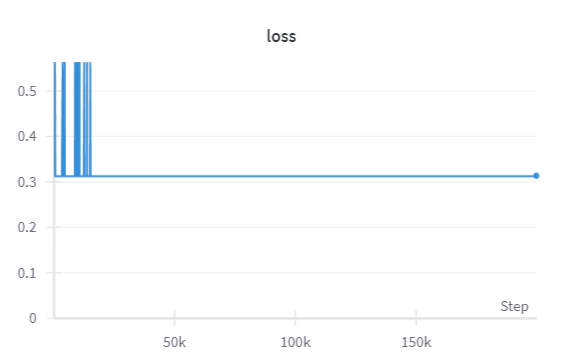

After fluctuation for around the first 15000 steps of the neural network, the loss from the training flattens out at y equals 0.3. The lower the value of loss is, the higher the accuracy of the neural network. A value of 0.3 is a good reflection of the neural network's predicitive capabiltiies

## Results of Accuracy Calculation

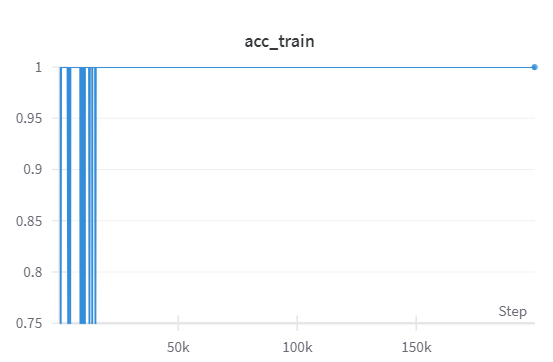

After fluctuation for around the first 15000 steps of the neural network, the accuracy from the training flattens out at y equals 1. This reflects that the accuracy of the model has come to a good point and it will capable of accurately predicting images from its training.